#In-silico Digital Breast Tomosynthesis dataset for the comparative analysis of Deep Learning models for tumor segmentation
Cristina Alfaro Vergara, Nicolás Araya, Claudia Prieto and Domingo
Mery

## download dataset

In [ ]:
!unzip -qq dbt_dataset.zip
!rm /content/dbt_dataset.zip

In [ ]:
!unzip -qq insilico_dataset.zip
!rm /content/insilico_dataset.zip

In [ ]:
!unzip -qq Hibrid_dataset.zip
!rm /content/Hibrid_dataset.zip

## install libraries

In [ ]:
%%capture
!pip install lightning segmentation-models-pytorch

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, Subset


import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision import models
import numpy as np
from PIL import Image

from lightning.pytorch.loggers import WandbLogger
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import ModelCheckpoint

from torch.optim import lr_scheduler

import os
import segmentation_models_pytorch as smp
import lightning as L

import torch.nn.functional as F
import matplotlib.pyplot as plt
import fnmatch

from   skimage.color import label2rgb
from sklearn.model_selection import StratifiedShuffleSplit



from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights



device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device:', device)

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Device: cuda


##Dataset customize

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        """
        Initializes the CustomDataset class.

        Args:
            image_dir (str): Path to the directory containing image files.
            mask_dir (str): Path to the directory containing mask files.
            transform (callable, optional): Transformations to apply to images and masks.

        Attributes:
            image_files (list): Sorted list of image file names in `image_dir`.
            mask_files (list): Sorted list of mask file names in `mask_dir`.
            labels (np.ndarray): Array of labels extracted from the mask files.
        """
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform

        # Collect all image and mask file names and sort them
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.tif')])
        self.mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('.tif')])

        # Ensure the number of images matches the number of masks
        assert len(self.image_files) == len(self.mask_files), "The number of images and masks must match."

        # Extract labels from the masks
        self.labels = self._extract_labels_from_masks()

    def _extract_labels_from_masks(self):
        """
        Extracts unique labels from the mask files.

        Returns:
            np.ndarray: Array of labels derived from the masks.
        """
        labels = []
        for mask_file in self.mask_files:
            mask_path = os.path.join(self.mask_dir, mask_file)
            mask = Image.open(mask_path).convert('L')  # Open mask and convert it to grayscale
            mask_array = np.array(mask)  # Convert the mask to a NumPy array
            unique_values = np.unique(mask_array)  # Get unique pixel values

            # If masks are binary, use the predominant value for labeling
            if len(unique_values) > 1:
                label = unique_values[1]  # Assume the second value is relevant
            else:
                label = unique_values[0]  # Use the single unique value

            labels.append(label)

        return np.array(labels)

    def __len__(self):
        """
        Returns the total number of samples in the dataset.

        Returns:
            int: Number of image-mask pairs.
        """
        return len(self.image_files)

    def __getitem__(self, idx):
        """
        Retrieves the image and mask at the specified index.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            tuple: A tuple containing the image and its corresponding mask.
        """
        # Get the file paths for the image and mask
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_files[idx])

        # Open the image and mask as grayscale
        image = Image.open(image_path).convert('L')
        mask = Image.open(mask_path).convert('L')

        # Apply transformations if specified
        if self.transform:
            if image:
                image = self.transform(image)
            if mask:
                mask = self.transform(mask)

        return image, mask


In [ ]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize images and masks to 128x128 resolution
    transforms.ToTensor(),         # Convert PIL images to PyTorch tensors
   # transforms.Normalize(mean=[0.4490], std=[0.1027])


])

image_dir = "/content/Hibrid_dataset/images"  # Directory containing the image files
mask_dir = "/content/Hibrid_dataset/masks"    # Directory containing the mask files
dataset = CustomDataset(image_dir, mask_dir, transform=transform)

labels = dataset.labels  # Extract the precomputed labels from the dataset

(np.float64(-0.5), np.float64(127.5), np.float64(127.5), np.float64(-0.5))

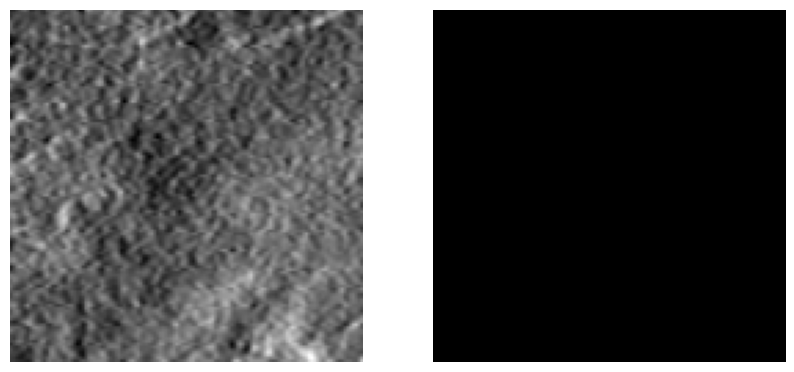

In [ ]:
# Retrieve the image and mask from the dataset at index 140
img, mask = dataset.__getitem__(220)

# Create a figure with two subplots (one for the image and one for the mask)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns, with a figure size of 10x5 inches

# Display the image in the first subplot
axes[0].imshow(img.permute(1, 2, 0).numpy(), cmap="gray")  # Convert tensor (C, H, W) to (H, W, C) for display
axes[0].axis('off')  # Disable axes for a cleaner display

# Display the mask in the second subplot
axes[1].imshow(mask.permute(1, 2, 0).numpy(), cmap="gray")  # Similarly adjust the tensor dimensions and show in grayscale
axes[1].axis('off')  # Disable axes for a cleaner display


In [ ]:
# Configure StratifiedShuffleSplit
split = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
# Creates a stratified splitter that maintains the distribution of labels across splits.
# - n_splits=5: Number of re-shuffling splits.
# - test_size=0.2: 20% of the dataset will be used as the test set.
# - random_state=42: Ensures reproducibility of the split.

# Perform the first split: Train/Validation + Test
train_val_indices, test_indices = next(split.split(np.zeros(len(labels)), labels))
# Splits the dataset into training/validation (80%) and testing (20%).
# `np.zeros(len(labels))`: Placeholder input for features since only labels are used for stratification.

# Perform the second split: Train and Validation
train_indices, val_indices = next(split.split(np.zeros(len(train_val_indices)), labels[train_val_indices]))
# Splits the training/validation set into separate training (80%) and validation (20%) subsets,
# maintaining the label distribution within the train/validation indices.

# Create subsets for train, validation, and test
train_dataset = Subset(dataset, train_indices)
# `train_dataset` contains only the data corresponding to the indices in `train_indices`.

val_dataset = Subset(dataset, val_indices)
# `val_dataset` contains only the data corresponding to the indices in `val_indices`.

test_dataset = Subset(dataset, test_indices)
# `test_dataset` contains only the data corresponding to the indices in `test_indices`.

# Create data loaders for the subsets
train_loader = DataLoader(train_dataset, batch_size=20, shuffle=True, num_workers=os.cpu_count())
# DataLoader for training:
# - `batch_size=20`: Each batch will contain 20 samples.
# - `shuffle=True`: Shuffles the data for each epoch to enhance training generalization.
# - `num_workers=os.cpu_count()`: Utilizes the maximum number of available CPU cores for data loading.

val_loader = DataLoader(val_dataset, batch_size=20, shuffle=False, num_workers=os.cpu_count())
# DataLoader for validation:
# - No shuffling as the data order is not critical for validation.

test_loader = DataLoader(test_dataset, batch_size=20, shuffle=False, num_workers=os.cpu_count())
# DataLoader for testing:
# - Similarly, no shuffling to ensure consistency in results.


In [ ]:
EPOCHS = 100
T_MAX = EPOCHS * len(train_loader)


##Unet model

In [ ]:
class Block(nn.Module):
    def __init__(self, inputs = 1, middles = 64, outs = 64):
        super().__init__()

        self.conv1 = nn.Conv2d(inputs, middles, 3, 1, 1)
        self.conv2 = nn.Conv2d(middles, outs, 3, 1, 1)
        self.relu = nn.ReLU()
        self.bn = nn.BatchNorm2d(outs)
        self.pool = nn.MaxPool2d(2, 2)

    def forward(self, x):

        x = self.relu(self.conv1(x))
        x = self.relu(self.bn(self.conv2(x)))
        # e1 = x
        # x = self.pool(x)

        return self.pool(x), x
        # self.pool(x): [bs, out, h*.5, w*.5]
        # x: [bs, out, h, w]

        # return x, e1
        # x: [bs, out, h*.5, w*.5]
        # e1: [bs, out, h, w]

In [ ]:
class UNet(nn.Module):
    def __init__(self,):
        super().__init__()
        #self.device = device
        #self.dropout = nn.Dropout(dropout)

        self.en1 = Block(1, 64, 64)
        self.en2 = Block(64, 128, 128)
        self.en3 = Block(128, 256, 256)
        self.en4 = Block(256, 512, 512)
        self.en5 = Block(512, 1024, 512)

        self.upsample4 = nn.ConvTranspose2d(512, 512, 2, stride = 2)
        self.de4 = Block(1024, 512, 256)

        self.upsample3 = nn.ConvTranspose2d(256, 256, 2, stride = 2)
        self.de3 = Block(512, 256, 128)

        self.upsample2 = nn.ConvTranspose2d(128, 128, 2, stride = 2)
        self.de2 = Block(256, 128, 64)

        self.upsample1 = nn.ConvTranspose2d(64, 64, 2, stride = 2)
        self.de1 = Block(128, 64, 64)

        self.conv_last = nn.Conv2d(64, 1, kernel_size=1, stride = 1, padding = 0)

    def forward(self, x):
        # x: [bs, 3, 256, 256]

        x, e1 = self.en1(x)
        # x: [bs, 64, 128, 128]
        # e1: [bs, 64, 256, 256]
        #print(f"enc 1: x:{x.shape} - e1:{e1.shape}" )

        x, e2 = self.en2(x)
        # x: [bs, 128, 64, 64]
        # e2: [bs, 128, 128, 128]
        #print(f"enc 2: x:{x.shape} - e2:{e2.shape}" )

        x, e3 = self.en3(x)
        # x: [bs, 256, 32, 32]
        # e3: [bs, 256, 64, 64]
        #print(f"encv3: x:{x.shape} - e3:{e3.shape}" )

        x, e4 = self.en4(x)
        # x: [bs, 512, 16, 16]
        # e4: [bs, 512, 32, 32]
        #print(f"encv4: x:{x.shape} - e4:{e4.shape}" )

        _, x = self.en5(x)
        # x: [bs, 512, 16, 16]
        #print(f"encv5: x:{x.shape}" )

        x = self.upsample4(x)
        # x: [bs, 512, 32, 32]
        #print(f"upsample 4: x:{x.shape}" )
        x = torch.cat([x, e4], dim=1)
        # x: [bs, 1024, 32, 32]
        _,  x = self.de4(x)
        #print(f"dec 4: x:{x.shape}" )
        # x: [bs, 256, 32, 32]

        x = self.upsample3(x)
        #print(f"dec 3: x:{x.shape}" )
        # x: [bs, 256, 64, 64]
        x = torch.cat([x, e3], dim=1)
        # x: [bs, 512, 64, 64]
        _, x = self.de3(x)
        # x: [bs, 128, 64, 64]

        x = self.upsample2(x)
        # x: [bs, 128, 128, 128]
        x = torch.cat([x, e2], dim=1)
        # x: [bs, 256, 128, 128]
        _, x = self.de2(x)
        # x: [bs, 64, 128, 128]

        x = self.upsample1(x)
        # x: [bs, 64, 256, 256]
        x = torch.cat([x, e1], dim=1)
        # x: [bs, 128, 256,256, 256
        _, x = self.de1(x)
        # x: [bs, 64, 256, 256]

        x = self.conv_last(x)
        # x: [bs, 1, 256, 256]

        # x = x.squeeze(1)
        return x

In [ ]:
class UNETModel(L.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = UNet()
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)


        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []


        self.test_preds = []
        self.test_targets = []

    def forward(self, image):
        mask = self.model(image)
        return mask

    def shared_step(self, batch, stage):
        image = batch[0]
        mask = batch[1]

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        # Log metrics
        self.log_dict(metrics, prog_bar=True)

        # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")

        # Guardar máscaras verdaderas y probabilidades predichas
        image, mask = batch
        logits_mask = self.forward(image)
        prob_mask = logits_mask.sigmoid()

        # Flatten (convertir a vectores)
        self.test_preds.append(prob_mask.detach().cpu().flatten())
        self.test_targets.append(mask.detach().cpu().flatten())

        self.test_step_outputs.append(output)
        return output["loss"]



    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory


    def configure_optimizers(self):
      return torch.optim.Adam(self.parameters(), lr=1e-4)


    def save_test_metrics(self):
        test_df = pd.DataFrame({
            "model": ["unet"],
            "test_precision": [self.test_metrics[0]['test_precision'].item()],
            "test_recall": [self.test_metrics[0]['test_recall'].item()],
            "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
            "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
            "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
            "test_loss": [self.test_metrics[0]['test_loss']],
            "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
            })
        # Save to CSV files
        test_df.to_csv("unet_test_metrics.csv", index=False)

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint
# model
unet_model = UNETModel().to(device)

early_stop = EarlyStopping(monitor= "valid_f1_score",
                           min_delta=0.00,
                           patience = 20,
                           verbose=True,
                           mode="max")
checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='unet-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # save model with best valid_f1_score value
                                       save_top_k=1,  # save best model
                                       )
## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[early_stop, SWA,checkpoint_callback]
    )


trainer.fit(model=unet_model, train_dataloaders=train_loader,val_dataloaders=val_loader)
trainer.test(unet_model, dataloaders=test_loader)
# Guardar métricas
unet_model.save_test_metrics()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | UNet     | 23.4 M | train
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
23.4 M    Trainable params
0         Non-trainable params
23.4 M    Total params
93.496    Total estimated model params size (MB)
61        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type     | Param

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.538
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.538


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.231 >= min_delta = 0.0. New best score: 0.768
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.231 >= min_delta = 0.0. New best score: 0.768


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.798
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.798


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.827
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.827


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.840
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.840


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.869
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.869


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.877
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.877


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.881
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.881


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.882
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.882


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.890
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.890


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.898
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.898


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.898. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.898. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.8861120343208313     │
│     test_dataset_iou      │            0.0            │
│       test_f1_score       │            0.0            │
│         test_loss         │            1.0            │
│    test_per_image_iou     │    0.3199999928474426     │
│      test_precision       │            nan            │
│        test_recall        │            0.0            │
└───────────────────────────┴───────────────────────────┘

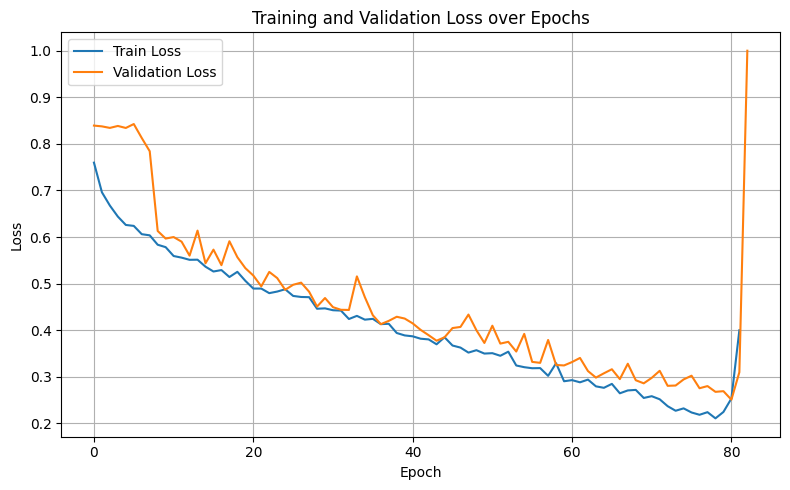

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_unet_losses = [m["train_loss"] for m in unet_model.train_metrics]
val_unet_losses = [m["valid_loss"] for m in unet_model.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_unet_losses, label="Train Loss")
plt.plot(val_unet_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


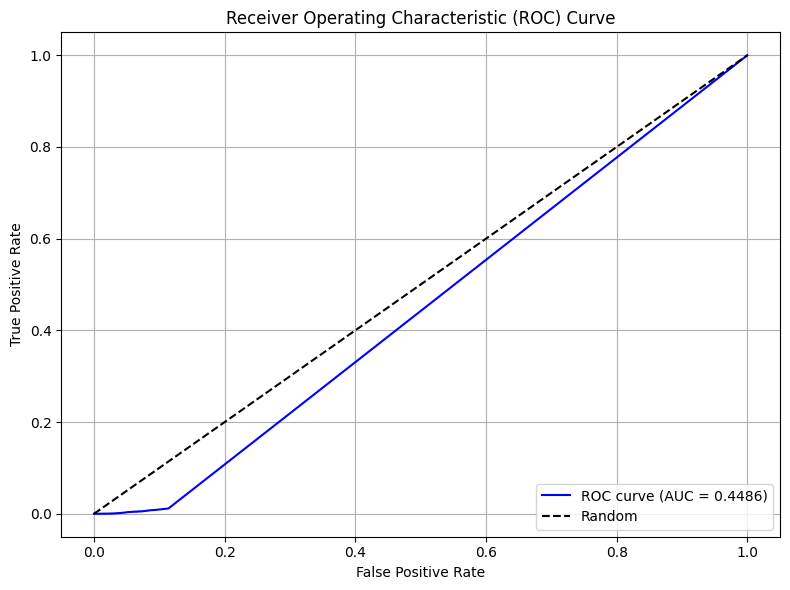

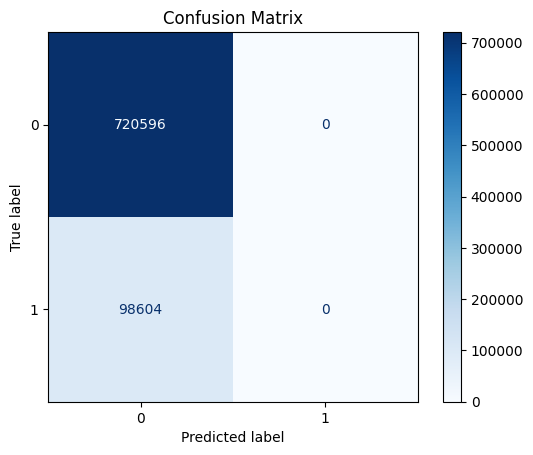

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Concatenar predicciones y etiquetas
all_preds = torch.cat(unet_model.test_preds).numpy()
all_targets = torch.cat(unet_model.test_targets).numpy()

# Asegurarse de que las etiquetas sean binarias
all_targets = (all_targets > 0.5).astype(int)

# Curva ROC
fpr, tpr, thresholds = roc_curve(all_targets, all_preds)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.4f})", color='blue')
plt.plot([0, 1], [0, 1], 'k--', label="Random")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid()
plt.tight_layout()
plt.savefig("roc_curve.png")
plt.show()

# Matriz de confusión
binary_preds = (all_preds > 0.5).astype(int)

conf_mat = confusion_matrix(all_targets, binary_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat)
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix")
plt.savefig("confusion_matrix.png")
plt.show()


## FCN resnet 50

In [ ]:
class FCN50(L.LightningModule):
    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.fcn_resnet50(pretrained=False, num_classes=1)

        self.model = models.segmentation.fcn_resnet50(weights=None, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)
        #self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["FCN50"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn50_test_metrics.csv", index=False)



In [ ]:
model_fcn50 = FCN50().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn50-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )
# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA, checkpoint_callback])

trainer.fit(model_fcn50, train_loader, val_loader)
trainer.test(model_fcn50, dataloaders=test_loader)
model_fcn50.save_test_metrics()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 183MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /content/models exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | FCN      | 32.9 M | train
1 | loss_fn | Dic

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.257
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.257


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.156 >= min_delta = 0.0. New best score: 0.413
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.156 >= min_delta = 0.0. New best score: 0.413


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.278 >= min_delta = 0.0. New best score: 0.691
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.278 >= min_delta = 0.0. New best score: 0.691


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.056 >= min_delta = 0.0. New best score: 0.747
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.056 >= min_delta = 0.0. New best score: 0.747


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.795
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.795


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.806
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.806


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.831
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.831


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.845
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.845


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.854
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.854


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.866
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.866


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.869
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.869


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.869. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.869. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     0.979205310344696     │
│     test_dataset_iou      │    0.8285268545150757     │
│       test_f1_score       │    0.9062233567237854     │
│         test_loss         │    0.10019594430923462    │
│    test_per_image_iou     │    0.8276790976524353     │
│      test_precision       │    0.9315512180328369     │
│        test_recall        │    0.8822363018989563     │
└───────────────────────────┴───────────────────────────┘

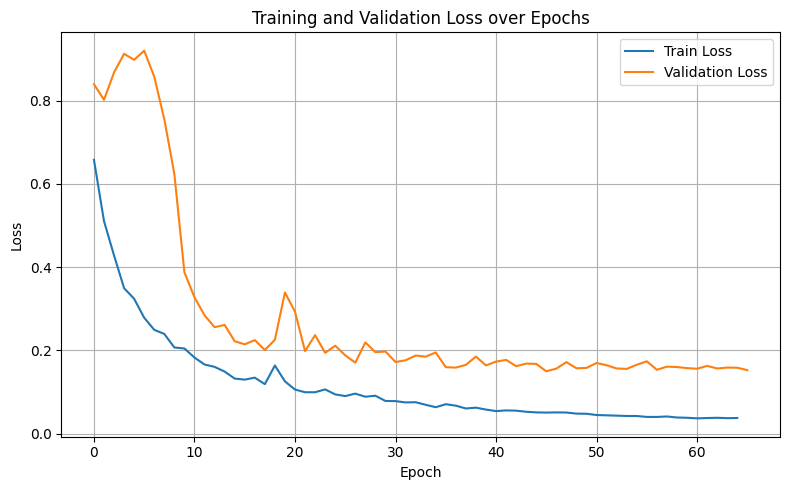

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_fcn50_losses = [m["train_loss"] for m in model_fcn50.train_metrics]
val_fcn50_losses = [m["valid_loss"] for m in model_fcn50.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_fcn50_losses, label="Train Loss")
plt.plot(val_fcn50_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## FCN resnet 101

In [ ]:

class FCN101(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.fcn_resnet50(pretrained=False, num_classes=1)

        self.model = models.segmentation.fcn_resnet101(weights=None, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)
        #self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):


      test_df = pd.DataFrame({
          "model": ["FCN101"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn101_test_metrics.csv", index=False)




In [ ]:
model_fcn101 = FCN101().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)


checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn101-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= 100,
    callbacks=[ early_stop,checkpoint_callback,SWA])

trainer.fit(model_fcn101, train_loader, val_loader)
trainer.test(model_fcn101, dataloaders=test_loader)
model_fcn101.save_test_metrics()

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 233MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | FCN      | 51.9 M | train
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
51.9 M    Trainable params
0         Non-trainable params
51.9 M    Total params
207.7

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.006
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.006


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.226 >= min_delta = 0.0. New best score: 0.232
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.226 >= min_delta = 0.0. New best score: 0.232


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.058 >= min_delta = 0.0. New best score: 0.290
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.058 >= min_delta = 0.0. New best score: 0.290


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.264 >= min_delta = 0.0. New best score: 0.554
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.264 >= min_delta = 0.0. New best score: 0.554


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.249 >= min_delta = 0.0. New best score: 0.804
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.249 >= min_delta = 0.0. New best score: 0.804


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.807
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.807


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.808
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.808


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.821
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.821


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.821
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.821


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.831
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.831


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.832
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.832


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.834
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.834


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.849
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.849


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.849
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.849


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.853
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.853


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.853
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.853


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.854
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.854


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.854. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.854. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     0.977825939655304     │
│     test_dataset_iou      │    0.8166558742523193     │
│       test_f1_score       │    0.8990760445594788     │
│         test_loss         │    0.12097638845443726    │
│    test_per_image_iou     │    0.8207640051841736     │
│      test_precision       │    0.9333371520042419     │
│        test_recall        │    0.8672412037849426     │
└───────────────────────────┴───────────────────────────┘

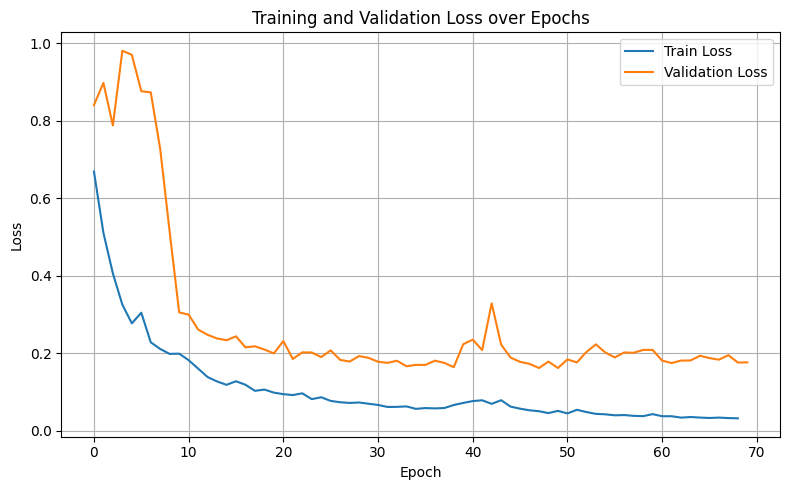

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_fcn101_losses = [m["train_loss"] for m in model_fcn101.train_metrics]
val_fcn101_losses = [m["valid_loss"] for m in model_fcn101.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_fcn101_losses, label="Train Loss")
plt.plot(val_fcn101_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## FCN resnet (50 Pretrained)

In [ ]:

from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights

class FCN50P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.fcn_resnet50(weights='DEFAULT')

        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        #self.loss_fn = torch.nn.BCEWithLogitsLoss()
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["FCN50 Pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn50_pretrained_test_metrics.csv", index=False)




In [ ]:
model_fcn50_ft = FCN50P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)
checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn50pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= 100,
    callbacks=[ early_stop, SWA, checkpoint_callback])

trainer.fit(model_fcn50_ft, train_loader, val_loader)
trainer.test(model_fcn50_ft, dataloaders=test_loader)
model_fcn50_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/fcn_resnet50_coco-1167a1af.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet50_coco-1167a1af.pth
100%|██████████| 135M/135M [00:01<00:00, 78.5MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | FCN      | 35.3 M | train
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
35.3 M    Trainable params
0         Non-trainable params
35.3 M    T

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.005
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.005


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.008
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.166 >= min_delta = 0.0. New best score: 0.174
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.166 >= min_delta = 0.0. New best score: 0.174


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.430 >= min_delta = 0.0. New best score: 0.604
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.430 >= min_delta = 0.0. New best score: 0.604


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.150 >= min_delta = 0.0. New best score: 0.754
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.150 >= min_delta = 0.0. New best score: 0.754


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.050 >= min_delta = 0.0. New best score: 0.804
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.050 >= min_delta = 0.0. New best score: 0.804


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.819
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.819


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.828
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.828


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.845
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.845


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.858
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.858


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.858. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.858. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     0.974230945110321     │
│     test_dataset_iou      │    0.7887246608734131     │
│       test_f1_score       │    0.8818849325180054     │
│         test_loss         │    0.19534868001937866    │
│    test_per_image_iou     │    0.7986802458763123     │
│      test_precision       │    0.9225069284439087     │
│        test_recall        │    0.8446895480155945     │
└───────────────────────────┴───────────────────────────┘

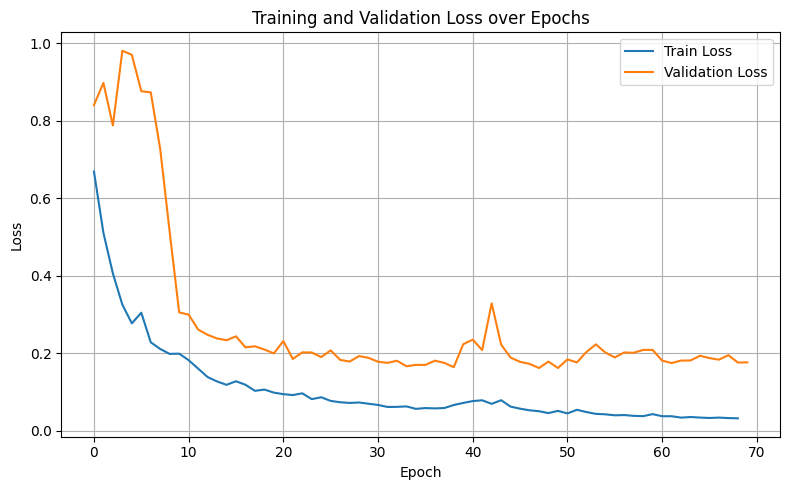

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_fcn50_ft_losses = [m["train_loss"] for m in model_fcn50_ft.train_metrics]
val_fcn50_ft_losses = [m["valid_loss"] for m in model_fcn50_ft.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_fcn101_losses, label="Train Loss")
plt.plot(val_fcn101_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## FCN resnet (101 Pretrained)

In [ ]:

class FCN101P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.fcn_resnet101(weights='DEFAULT')

        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        #self.loss_fn = torch.nn.BCEWithLogitsLoss()
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["FCN101 Pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("fcn101_pretrained_test_metrics.csv", index=False)



In [ ]:
model_fcn101_ft = FCN101P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)
checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='fcn101pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )



# train model
trainer = L.Trainer(
    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_fcn101_ft, train_loader, val_loader)
trainer.test(model_fcn101_ft, dataloaders=test_loader)
model_fcn101_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/fcn_resnet101_coco-7ecb50ca.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet101_coco-7ecb50ca.pth
100%|██████████| 208M/208M [00:01<00:00, 205MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | FCN      | 54.3 M | train
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
54.3 M    Trainable params
0         Non-trainable params
54.3 M    

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.002
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.002


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.131 >= min_delta = 0.0. New best score: 0.133
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.131 >= min_delta = 0.0. New best score: 0.133


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.096 >= min_delta = 0.0. New best score: 0.229
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.096 >= min_delta = 0.0. New best score: 0.229


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.313 >= min_delta = 0.0. New best score: 0.542
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.313 >= min_delta = 0.0. New best score: 0.542


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.241 >= min_delta = 0.0. New best score: 0.783
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.241 >= min_delta = 0.0. New best score: 0.783


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.812
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.029 >= min_delta = 0.0. New best score: 0.812


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.816
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.816


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.816
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.816


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.830
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.830


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.837
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.837


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.840
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.840


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.845
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.845


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.853
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.853


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.854
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.854


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.854. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.854. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9777172803878784     │
│     test_dataset_iou      │     0.815554678440094     │
│       test_f1_score       │    0.8984082937240601     │
│         test_loss         │    0.12806832790374756    │
│    test_per_image_iou     │    0.8290727138519287     │
│      test_precision       │    0.9343621134757996     │
│        test_recall        │    0.8651189208030701     │
└───────────────────────────┴───────────────────────────┘

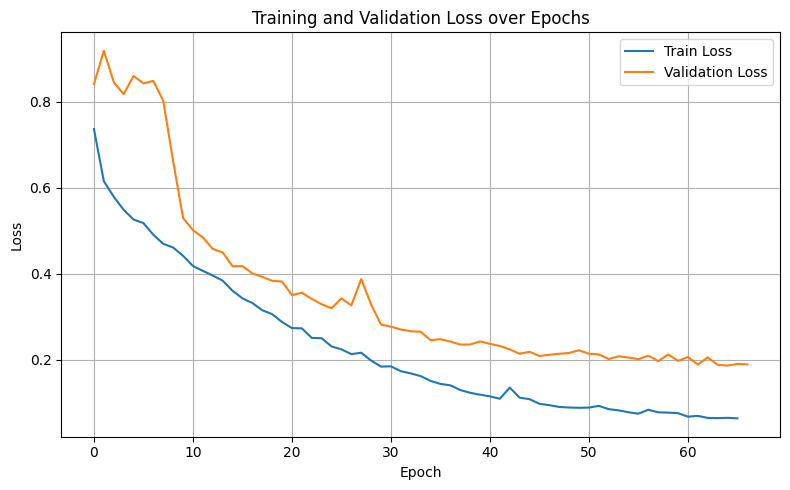

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_fcn101_ft_losses = [m["train_loss"] for m in model_fcn101_ft.train_metrics]
val_fcn101_ft_losses = [m["valid_loss"] for m in model_fcn101_ft.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_fcn101_ft_losses, label="Train Loss")
plt.plot(val_fcn101_ft_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## DEEPLABV3 resnet 50

In [ ]:
class DeepLabv350(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.deeplabv3_resnet50(weights=None, num_classes=1)
        #self.model = models.segmentation.deeplabv3_resnet101(pretrained=False, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv350"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv350_test_metrics.csv", index=False)



In [ ]:
model_deeplab50 = DeepLabv350().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv350-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )



# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplab50, train_loader, val_loader)
trainer.test(model_deeplab50, dataloaders=test_loader)
model_deeplab50.save_test_metrics()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | DeepLabV3 | 39.6 M | train
1 | loss_fn | DiceLoss  | 0      | train
----------------------------------------------
39.6 M    Trainable params
0         Non-trainable params
39.6 M    Total params
158.510   Total estimated model params size (MB)
184       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type      |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.209
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.209


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.256 >= min_delta = 0.0. New best score: 0.464
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.256 >= min_delta = 0.0. New best score: 0.464


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.237 >= min_delta = 0.0. New best score: 0.701
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.237 >= min_delta = 0.0. New best score: 0.701


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.083 >= min_delta = 0.0. New best score: 0.783
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.083 >= min_delta = 0.0. New best score: 0.783


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.808
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.024 >= min_delta = 0.0. New best score: 0.808


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.827
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.019 >= min_delta = 0.0. New best score: 0.827


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.829
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.829


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.830
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.830


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.842
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.842


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.846
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.846


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.850
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.850


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.851
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.851


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.855
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.855


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.857
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.857


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.860
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.860


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.860. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.860. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9805188179016113     │
│     test_dataset_iou      │    0.8420276641845703     │
│       test_f1_score       │    0.9142399430274963     │
│         test_loss         │    0.10543737560510635    │
│    test_per_image_iou     │    0.8190529346466064     │
│      test_precision       │    0.9167277216911316     │
│        test_recall        │    0.9117656350135803     │
└───────────────────────────┴───────────────────────────┘

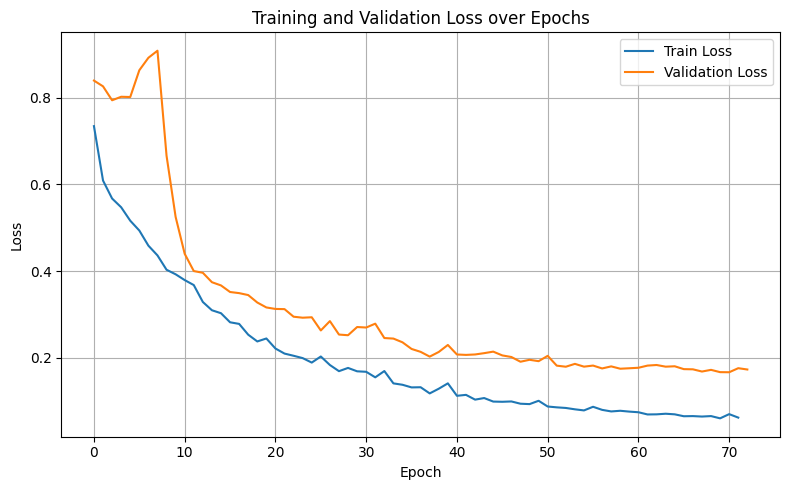

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplab50_losses = [m["train_loss"] for m in model_deeplab50.train_metrics]
val_deeplab50_losses = [m["valid_loss"] for m in model_deeplab50.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplab50_losses, label="Train Loss")
plt.plot(val_deeplab50_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## DEEPLABV3 101

In [ ]:
class DeepLabv3101(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.deeplabv3_resnet50(pretrained=False, num_classes=1)
        self.model = models.segmentation.deeplabv3_resnet101(weights=None, num_classes=1)

        # Cambiar el primer layer Conv2d para que acepte 1 canal en lugar de 3
        in_channels = self.model.backbone.conv1.in_channels
        self.model.backbone.conv1 = torch.nn.Conv2d(
            1,  # 1 canal para imágenes en escala de grises
            self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )

        # Define the loss function
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3101"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3101_test_metrics.csv", index=False)




In [ ]:
model_deeplab101 = DeepLabv3101().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv3101-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )



# train model
trainer = L.Trainer(
    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplab101, train_loader, val_loader)
trainer.test(model_deeplab101, dataloaders=test_loader)
model_deeplab101.save_test_metrics()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | DeepLabV3 | 58.6 M | train
1 | loss_fn | DiceLoss  | 0      | train
----------------------------------------------
58.6 M    Trainable params
0         Non-trainable params
58.6 M    Total params
234.479   Total estimated model params size (MB)
320       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type      |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.222
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.222


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.068 >= min_delta = 0.0. New best score: 0.290
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.068 >= min_delta = 0.0. New best score: 0.290


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.413 >= min_delta = 0.0. New best score: 0.702
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.413 >= min_delta = 0.0. New best score: 0.702


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.075 >= min_delta = 0.0. New best score: 0.778
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.075 >= min_delta = 0.0. New best score: 0.778


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.826
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.048 >= min_delta = 0.0. New best score: 0.826


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.835
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.835


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.852
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.852


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.866
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.866


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.869
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.869


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.870
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.870


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.874
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.874


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.874
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.874


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.880
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.880


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.880. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.880. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9039282202720642     │
│     test_dataset_iou      │    0.5168662667274475     │
│       test_f1_score       │    0.6814922094345093     │
│         test_loss         │    0.3189045190811157     │
│    test_per_image_iou     │    0.3789346218109131     │
│      test_precision       │    0.5474482774734497     │
│        test_recall        │    0.9024620056152344     │
└───────────────────────────┴───────────────────────────┘

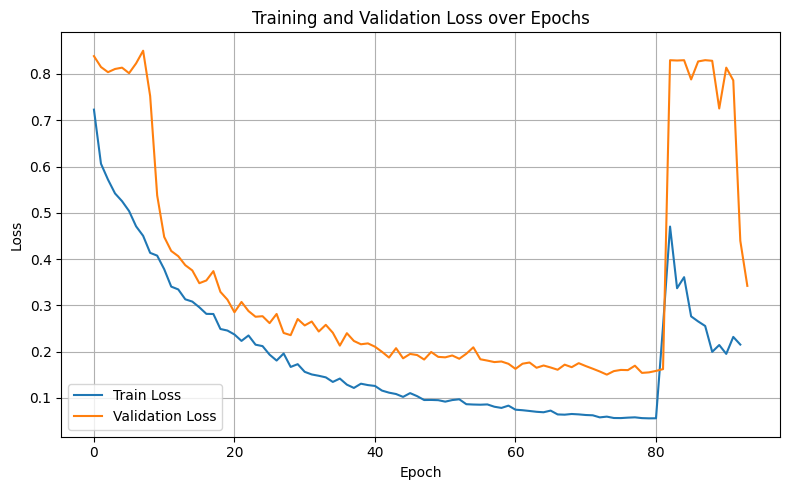

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplab101_losses = [m["train_loss"] for m in model_deeplab101.train_metrics]
val_deeplab101_losses = [m["valid_loss"] for m in model_deeplab101.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplab101_losses, label="Train Loss")
plt.plot(val_deeplab101_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## DEEPLABV3 resnet 50 (pretrained)

In [ ]:
class DeepLabv350P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = models.segmentation.deeplabv3_resnet50(weights='DEFAULT')
        #self.model = models.segmentation.deeplabv3_resnet101(pretrained=False, num_classes=1)

        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )
        # Define the loss function
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):
      test_df = pd.DataFrame({
          "model": ["DeepLabv350 finetuned"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv350_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplab50_ft = DeepLabv350P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv350_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplab50_ft, train_loader, val_loader)
trainer.test(model_deeplab50_ft, dataloaders=test_loader)
model_deeplab50_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:00<00:00, 223MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | DeepLabV3 | 42.0 M | train
1 | loss_fn | DiceLoss  | 0      | train
----------------------------------------------
42.0 M    Trainable params
0         Non-trainable pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.382 >= min_delta = 0.0. New best score: 0.382
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.382 >= min_delta = 0.0. New best score: 0.382


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.241 >= min_delta = 0.0. New best score: 0.623
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.241 >= min_delta = 0.0. New best score: 0.623


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.137 >= min_delta = 0.0. New best score: 0.760
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.137 >= min_delta = 0.0. New best score: 0.760


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.790
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.790


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.793
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.793


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.809
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.017 >= min_delta = 0.0. New best score: 0.809


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.814
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.814


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.815
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.815


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.828
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.828


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.842
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.842


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.845
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.845


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.845
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.845


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.845. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.845. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9735119342803955     │
│     test_dataset_iou      │    0.7889140844345093     │
│       test_f1_score       │    0.8820033073425293     │
│         test_loss         │     0.189483642578125     │
│    test_per_image_iou     │    0.7991783022880554     │
│      test_precision       │    0.8951411843299866     │
│        test_recall        │    0.8692455291748047     │
└───────────────────────────┴───────────────────────────┘

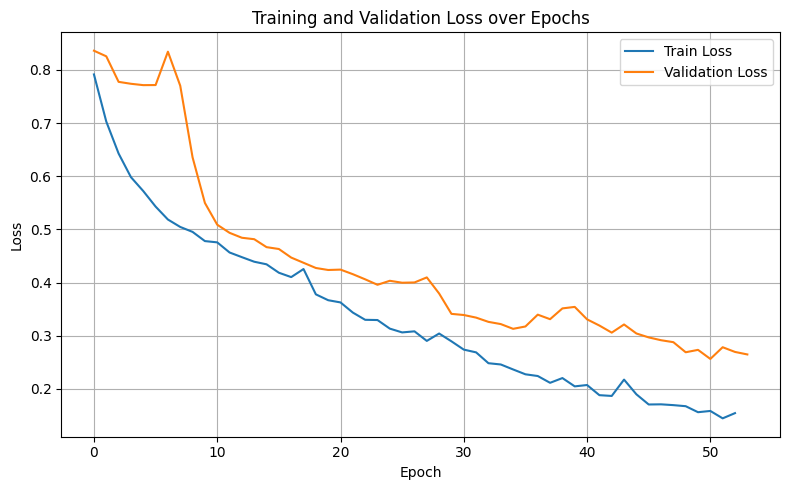

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplab50_ft_losses = [m["train_loss"] for m in model_deeplab50_ft.train_metrics]
val_deeplab50_ft_losses = [m["valid_loss"] for m in model_deeplab50_ft.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplab50_ft_losses, label="Train Loss")
plt.plot(val_deeplab50_ft_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()


## DEEPLABV3 101(pretrained)

In [ ]:
class DeepLabv3101P(L.LightningModule):

    def __init__(self):
        super().__init__()
        #self.model = models.segmentation.deeplabv3_resnet50(pretrained=False, num_classes=1)
        self.model = models.segmentation.deeplabv3_resnet101(weights='DEFAULT')



        # Cambia el número de clases de salida para la segmentación binaria
        self.model.classifier[4] = torch.nn.Conv2d(
            in_channels=self.model.classifier[4].in_channels,
            out_channels=1,  # 2 clases para binaria (tumor y fondo)
            kernel_size=self.model.classifier[4].kernel_size,
            padding=self.model.classifier[4].padding
        )

        # Modificar la primera capa Conv2d para aceptar imágenes en escala de grises
        self.model.backbone.conv1 = torch.nn.Conv2d(
            in_channels=1,  # 1 canal para imágenes en escala de grises
            out_channels=self.model.backbone.conv1.out_channels,
            kernel_size=self.model.backbone.conv1.kernel_size,
            stride=self.model.backbone.conv1.stride,
            padding=self.model.backbone.conv1.padding
        )
        # Define the loss function
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # Initialize lists to store results for each epoch
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []

    def forward(self, x):
        return self.model(x)['out']

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3101 finetuned"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3101_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplab101_ft = DeepLabv3101P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv3101_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback]
    )

trainer.fit(model_deeplab101_ft, train_loader, val_loader)
trainer.test(model_deeplab101_ft, dataloaders=test_loader)
model_deeplab101_ft.save_test_metrics()

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth
100%|██████████| 233M/233M [00:01<00:00, 216MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | DeepLabV3 | 61.0 M | train
1 | loss_fn | DiceLoss  | 0      | train
----------------------------------------------
61.0 M    Trainable params
0         Non-trainable 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.203 >= min_delta = 0.0. New best score: 0.203
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.203 >= min_delta = 0.0. New best score: 0.203


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.071 >= min_delta = 0.0. New best score: 0.274
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.071 >= min_delta = 0.0. New best score: 0.274


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.182 >= min_delta = 0.0. New best score: 0.457
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.182 >= min_delta = 0.0. New best score: 0.457


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.324 >= min_delta = 0.0. New best score: 0.781
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.324 >= min_delta = 0.0. New best score: 0.781


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.789
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.789


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.025 >= min_delta = 0.0. New best score: 0.815
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.025 >= min_delta = 0.0. New best score: 0.815


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.826
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.826


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.830
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.830


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.841
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.841


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.841
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.841


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.848
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.848


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.851
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.851


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.857
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.857


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.859
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.859


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.868
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.868


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.871
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.871


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.872
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.872


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.873
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.873


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.875
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.002 >= min_delta = 0.0. New best score: 0.875


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.876
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.876


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.877
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.877


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.877. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.877. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9767284989356995     │
│     test_dataset_iou      │    0.8107773065567017     │
│       test_f1_score       │    0.8955019116401672     │
│         test_loss         │    0.1380712389945984     │
│    test_per_image_iou     │    0.8126089572906494     │
│      test_precision       │    0.9163983464241028     │
│        test_recall        │    0.8755372762680054     │
└───────────────────────────┴───────────────────────────┘

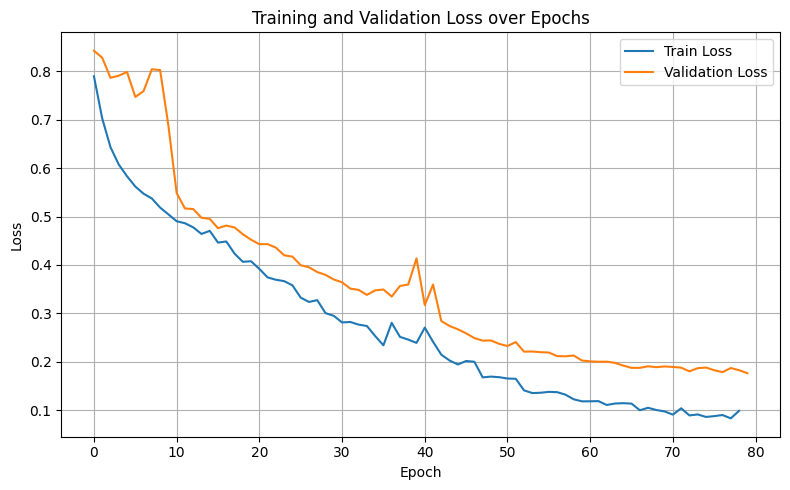

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplab101_ft_losses = [m["train_loss"] for m in model_deeplab101_ft.train_metrics]
val_deeplab101_ft_losses = [m["valid_loss"] for m in model_deeplab101_ft.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplab101_ft_losses, label="Train Loss")
plt.plot(val_deeplab101_ft_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()

##Deeplabv3+ resnet50


In [ ]:
class DeepLabv3plus50(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet50',in_channels=1,encoder_weights=None,classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus resnet50"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus50_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus50 = DeepLabv3plus50().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)


checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deeplabv350plus-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )

# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus50, train_loader, val_loader)
trainer.test(model_deeplabv3plus50, dataloaders=test_loader)
model_deeplabv3plus50.save_test_metrics()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | model   | DeepLabV3Plus | 26.7 M | train
1 | loss_fn | DiceLoss      | 0      | train
--------------------------------------------------
26.7 M    Trainable params
0         Non-trainable params
26.7 M    Total params
106.685   Total estimated model params size (MB)
208       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | N

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.297
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.297


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.067 >= min_delta = 0.0. New best score: 0.364
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.067 >= min_delta = 0.0. New best score: 0.364


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.171 >= min_delta = 0.0. New best score: 0.535
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.171 >= min_delta = 0.0. New best score: 0.535


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.057 >= min_delta = 0.0. New best score: 0.592
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.057 >= min_delta = 0.0. New best score: 0.592


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.091 >= min_delta = 0.0. New best score: 0.683
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.091 >= min_delta = 0.0. New best score: 0.683


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.020 >= min_delta = 0.0. New best score: 0.703
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.020 >= min_delta = 0.0. New best score: 0.703


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.713
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.713


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.722
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.722


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.031 >= min_delta = 0.0. New best score: 0.754
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.031 >= min_delta = 0.0. New best score: 0.754


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.757
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.757


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.758
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.758


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.768
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.010 >= min_delta = 0.0. New best score: 0.768


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.774
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.006 >= min_delta = 0.0. New best score: 0.774


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.781
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.007 >= min_delta = 0.0. New best score: 0.781


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.793
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.012 >= min_delta = 0.0. New best score: 0.793


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.016 >= min_delta = 0.0. New best score: 0.808
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.016 >= min_delta = 0.0. New best score: 0.808


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.808. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.808. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     0.93499755859375      │
│     test_dataset_iou      │    0.6022914052009583     │
│       test_f1_score       │    0.7517876029014587     │
│         test_loss         │    0.2533523738384247     │
│    test_per_image_iou     │    0.5754126906394958     │
│      test_precision       │    0.6651600003242493     │
│        test_recall        │    0.8643578886985779     │
└───────────────────────────┴───────────────────────────┘

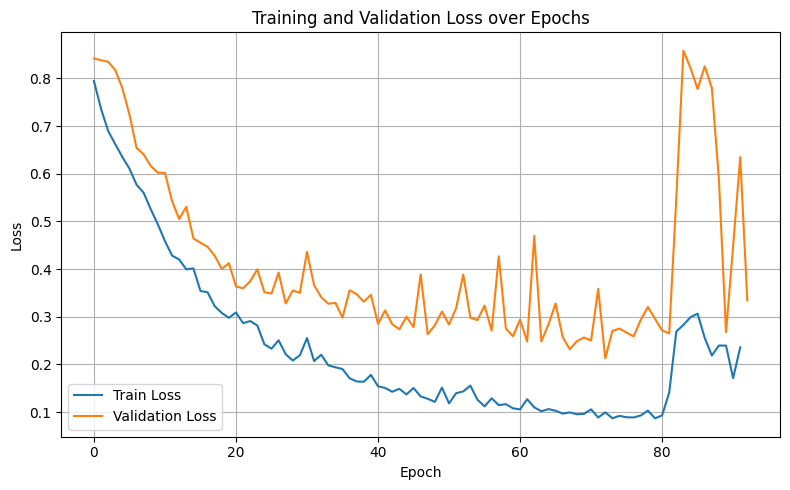

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplabv3plus50_losses = [m["train_loss"] for m in model_deeplabv3plus50.train_metrics]
val_deeplabv3plus50_losses = [m["valid_loss"] for m in model_deeplabv3plus50.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplabv3plus50_losses, label="Train Loss")
plt.plot(val_deeplabv3plus50_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()

##Deeplabv3+ resnet101


In [ ]:
class DeepLabv3plus101(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet101',in_channels=1,encoder_weights=None,classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus resnet101"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus101_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus101 = DeepLabv3plus101().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deepv3101plus-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus101, train_loader, val_loader)
trainer.test(model_deeplabv3plus101, dataloaders=test_loader)
model_deeplabv3plus101.save_test_metrics()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | model   | DeepLabV3Plus | 45.7 M | train
1 | loss_fn | DiceLoss      | 0      | train
--------------------------------------------------
45.7 M    Trainable params
0         Non-trainable params
45.7 M    Total params
182.654   Total estimated model params size (MB)
344       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | N

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.481 >= min_delta = 0.0. New best score: 0.481
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.481 >= min_delta = 0.0. New best score: 0.481


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.103 >= min_delta = 0.0. New best score: 0.585
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.103 >= min_delta = 0.0. New best score: 0.585


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.590
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.590


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.092 >= min_delta = 0.0. New best score: 0.682
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.092 >= min_delta = 0.0. New best score: 0.682


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.685
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.685


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.689
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.689


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.690
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.690


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.712
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.712


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.725
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.013 >= min_delta = 0.0. New best score: 0.725


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.740
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.740


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.749
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.749


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.749
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.000 >= min_delta = 0.0. New best score: 0.749


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.749. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.749. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9591931104660034     │
│     test_dataset_iou      │    0.6812490820884705     │
│       test_f1_score       │    0.8104082942008972     │
│         test_loss         │    0.22141914069652557    │
│    test_per_image_iou     │    0.7684460878372192     │
│      test_precision       │     0.860546350479126     │
│        test_recall        │    0.7657909393310547     │
└───────────────────────────┴───────────────────────────┘

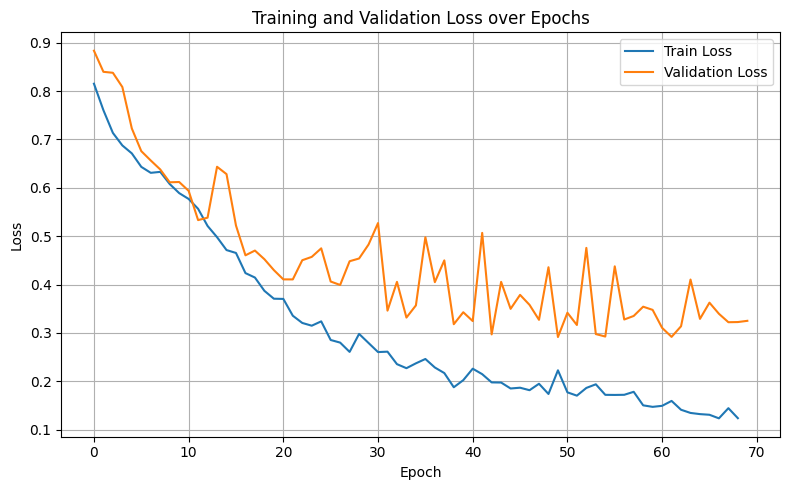

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplabv3plus101_losses = [m["train_loss"] for m in model_deeplabv3plus101.train_metrics]
val_deeplabv3plus101_losses = [m["valid_loss"] for m in model_deeplabv3plus101.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplabv3plus101_losses, label="Train Loss")
plt.plot(val_deeplabv3plus101_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()

##Deeplabv3+ resnet50 pretrained


In [ ]:
class DeepLabv3plus50P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet50',in_channels=1,encoder_weights='imagenet',classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus50 pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus50_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus50_ft = DeepLabv3plus50P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deepv350plus_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(
    #logger = wandb_logger,

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus50_ft, train_loader, val_loader)
trainer.test(model_deeplabv3plus50_ft, dataloaders=test_loader)
model_deeplabv3plus50_ft.save_test_metrics()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | model   | DeepLabV3Plus | 26.7 M | train
1 | loss_fn | DiceLoss      | 0      | train
--------------------------------------------------
26.7 M    Trainable params
0         Non-trainable params
26.7 M    Total params
106.685   Total estimated model params size (MB)
208       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | N

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.000
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.000


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.045 >= min_delta = 0.0. New best score: 0.045
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.045 >= min_delta = 0.0. New best score: 0.045


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.492 >= min_delta = 0.0. New best score: 0.537
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.492 >= min_delta = 0.0. New best score: 0.537


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.018 >= min_delta = 0.0. New best score: 0.555
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.018 >= min_delta = 0.0. New best score: 0.555


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.101 >= min_delta = 0.0. New best score: 0.655
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.101 >= min_delta = 0.0. New best score: 0.655


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.686
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.030 >= min_delta = 0.0. New best score: 0.686


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.070 >= min_delta = 0.0. New best score: 0.756
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.070 >= min_delta = 0.0. New best score: 0.756


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.777
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.022 >= min_delta = 0.0. New best score: 0.777


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.016 >= min_delta = 0.0. New best score: 0.794
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.016 >= min_delta = 0.0. New best score: 0.794


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.794
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.794


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.033 >= min_delta = 0.0. New best score: 0.827
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.033 >= min_delta = 0.0. New best score: 0.827


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.832
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.832


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.846
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.014 >= min_delta = 0.0. New best score: 0.846


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.855
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.009 >= min_delta = 0.0. New best score: 0.855


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.858
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.858


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.859
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.859


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.874
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.015 >= min_delta = 0.0. New best score: 0.874


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.878
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.878


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.881
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.003 >= min_delta = 0.0. New best score: 0.881


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.881. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.881. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9795507788658142     │
│     test_dataset_iou      │    0.8325352668762207     │
│       test_f1_score       │    0.9086158275604248     │
│         test_loss         │    0.1286935806274414     │
│    test_per_image_iou     │    0.8184596300125122     │
│      test_precision       │    0.9251697063446045     │
│        test_recall        │     0.892643928527832     │
└───────────────────────────┴───────────────────────────┘

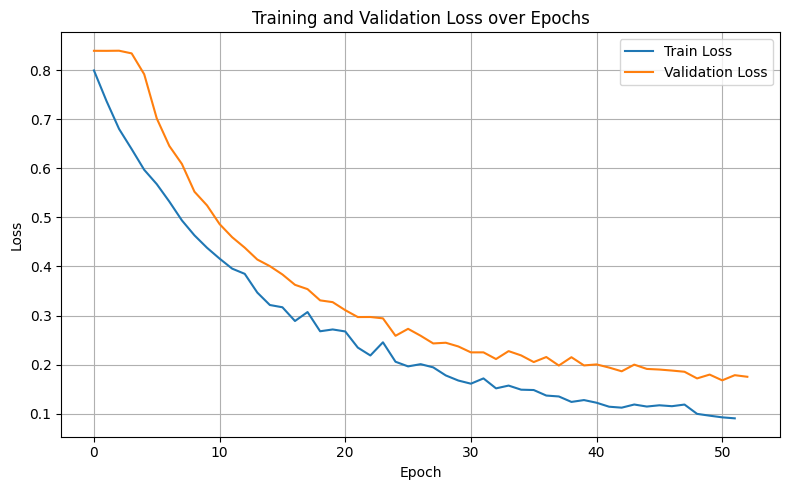

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplabv3plus50_ft_losses = [m["train_loss"] for m in model_deeplabv3plus50_ft.train_metrics]
val_deeplabv3plus50_ft_losses = [m["valid_loss"] for m in model_deeplabv3plus50_ft.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplabv3plus50_ft_losses, label="Train Loss")
plt.plot(val_deeplabv3plus50_ft_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()

##Deeplabv3+ resnet101 pretrained


In [ ]:
class DeepLabv3plus101P(L.LightningModule):

    def __init__(self):
        super().__init__()
        self.model = smp.DeepLabV3Plus(encoder_name='resnet101',in_channels=1,encoder_weights='imagenet',classes=1)

        # initialize step metics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)


        # Initialize lists to store accumulated metrics
        self.train_metrics = []
        self.valid_metrics = []
        self.test_metrics = []




    def forward(self, x):
        return self.model(x)

    def shared_step(self, batch, stage):
        image, mask = batch

        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)

        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        total_loss = sum(x['loss'].item() for x in outputs)
        iter_count = len(outputs)

        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        recall = smp.metrics.recall(tp, fp, fn, tn, reduction="micro")
        precision = smp.metrics.precision(tp, fp, fn, tn, reduction="micro")

        f1_score = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
        accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")

        metrics = {
            f"{stage}_loss": total_loss / iter_count,
            f"{stage}_precision": precision,
            f"{stage}_recall": recall,
            f"{stage}_accuracy": accuracy,
            f"{stage}_f1_score": f1_score,
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

          # Append metrics to the corresponding list
        if stage == "train":
            self.train_metrics.append(metrics)
        elif stage == "valid":
            self.valid_metrics.append(metrics)
        elif stage == "test":
            self.test_metrics.append(metrics)

    def training_step(self, batch, batch_idx):
        output = self.shared_step(batch, "train")
        self.training_step_outputs.append(output)
        return output["loss"]

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()  # free memory

    def validation_step(self, batch, batch_idx):
        output = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(output)
        return output["loss"]

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()  # free memory

    def test_step(self, batch, batch_idx):
        output = self.shared_step(batch, "test")
        self.test_step_outputs.append(output)
        return output["loss"]

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()  # free memory

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)


    def save_test_metrics(self):

      test_df = pd.DataFrame({
          "model": ["DeepLabv3plus101 pretrained"],
          "test_precision": [self.test_metrics[0]['test_precision'].item()],
          "test_recall": [self.test_metrics[0]['test_recall'].item()],
          "test_f1_score": [self.test_metrics[0]['test_f1_score'].item()],
          "test_per_image_iou": [self.test_metrics[0]['test_per_image_iou'].item()],
          "test_dataset_iou": [self.test_metrics[0]['test_dataset_iou'].item()],
          "test_loss": [self.test_metrics[0]['test_loss']],
          "test_accuracy": [self.test_metrics[0]['test_accuracy'].item()],
          })
      # Save to CSV files
      test_df.to_csv("deeplabv3plus101_pretrained_test_metrics.csv", index=False)



In [ ]:
model_deeplabv3plus101_ft = DeepLabv3plus101P().to(device)
early_stop = EarlyStopping(monitor= "valid_f1_score", min_delta=0.00, patience = 20, verbose=True, mode="max")

## Scheduler
SWA = L.pytorch.callbacks.StochasticWeightAveraging(swa_lrs=1e-2)

checkpoint_callback = ModelCheckpoint( monitor='valid_f1_score',
                                      dirpath='/content/models',
                                       filename='deepv3101plus_pretrained-{epoch:02d}-{valid_f1_score:.2f}',
                                       mode='max',  # Guardar el modelo con el mejor valor de valid_f1_score
                                       save_top_k=1,  # Guardar solo el mejor modelo
                                       )


# train model
trainer = L.Trainer(

    max_epochs= EPOCHS,
    callbacks=[ early_stop, SWA,checkpoint_callback])

trainer.fit(model_deeplabv3plus101_ft, train_loader, val_loader)
trainer.test(model_deeplabv3plus101_ft, dataloaders=test_loader)
model_deeplabv3plus101_ft.save_test_metrics()

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | model   | DeepLabV3Plus | 45.7 M | train
1 | loss_fn | DiceLoss      | 0      | train
--------------------------------------------------
45.7 M    Trainable params
0         Non-trainable params
45.7 M    Total params
182.654   Total estimated model params size (MB)
344       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | N

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved. New best score: 0.161
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved. New best score: 0.161


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.267 >= min_delta = 0.0. New best score: 0.428
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.267 >= min_delta = 0.0. New best score: 0.428


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.161 >= min_delta = 0.0. New best score: 0.589
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.161 >= min_delta = 0.0. New best score: 0.589


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.087 >= min_delta = 0.0. New best score: 0.676
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.087 >= min_delta = 0.0. New best score: 0.676


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.038 >= min_delta = 0.0. New best score: 0.715
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.038 >= min_delta = 0.0. New best score: 0.715


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.719
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.004 >= min_delta = 0.0. New best score: 0.719


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.064 >= min_delta = 0.0. New best score: 0.783
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.064 >= min_delta = 0.0. New best score: 0.783


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.046 >= min_delta = 0.0. New best score: 0.829
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.046 >= min_delta = 0.0. New best score: 0.829


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.840
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.011 >= min_delta = 0.0. New best score: 0.840


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.844
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.844


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.850
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.005 >= min_delta = 0.0. New best score: 0.850


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.858
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.008 >= min_delta = 0.0. New best score: 0.858


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.018 >= min_delta = 0.0. New best score: 0.876
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.018 >= min_delta = 0.0. New best score: 0.876


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.878
INFO:lightning.pytorch.callbacks.early_stopping:Metric valid_f1_score improved by 0.001 >= min_delta = 0.0. New best score: 0.878


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.878. Signaling Trainer to stop.
INFO:lightning.pytorch.callbacks.early_stopping:Monitored metric valid_f1_score did not improve in the last 20 records. Best score: 0.878. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9278014898300171     │
│     test_dataset_iou      │    0.5879976153373718     │
│       test_f1_score       │    0.7405523061752319     │
│         test_loss         │    0.25971201062202454    │
│    test_per_image_iou     │    0.8129615783691406     │
│      test_precision       │    0.6268007159233093     │
│        test_recall        │    0.9047450423240662     │
└───────────────────────────┴───────────────────────────┘

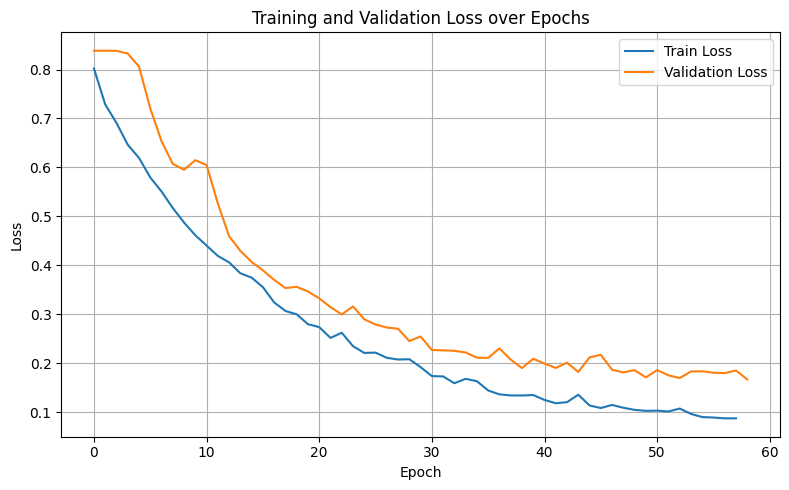

In [ ]:
import matplotlib.pyplot as plt

# Extraer las pérdidas
train_deeplabv3plus101_ft_losses = [m["train_loss"] for m in model_deeplabv3plus101_ft.train_metrics]
val_deeplabv3plus101_ft_losses = [m["valid_loss"] for m in model_deeplabv3plus101_ft.valid_metrics]

# Graficar
plt.figure(figsize=(8, 5))
plt.plot(train_deeplabv3plus101_ft_losses, label="Train Loss")
plt.plot(val_deeplabv3plus101_ft_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  # Puedes guardar la figura si quieres
plt.show()

##image

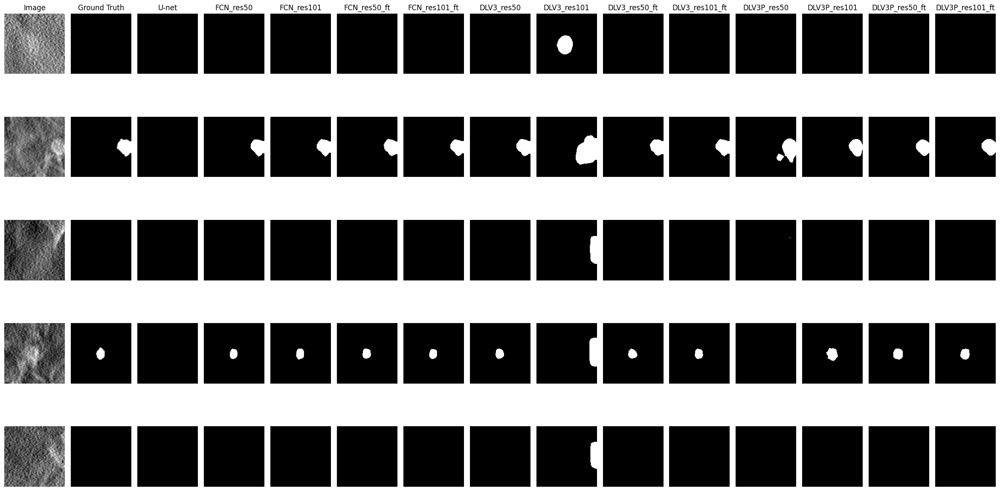

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Obtén un lote de datos
batch = next(iter(test_loader))
with torch.no_grad():
    # Coloca los modelos en modo evaluación
    unet_model.eval()
    model_fcn50.eval()
    model_fcn101.eval()
    model_fcn50_ft.eval()
    model_fcn101_ft.eval()
    model_deeplab50.eval()
    model_deeplab101.eval()
    model_deeplab50_ft.eval()
    model_deeplab101_ft.eval()
    model_deeplabv3plus50.eval()
    model_deeplabv3plus101.eval()
    model_deeplabv3plus50_ft.eval()
    model_deeplabv3plus101_ft.eval()

    # Predicciones de los modelos
    unet_pred = unet_model(batch[0])
    fcn50_pred = model_fcn50(batch[0])
    fcn101_pred = model_fcn101(batch[0])
    fcn50_ft_pred = model_fcn50_ft(batch[0])
    fcn101_ft_pred = model_fcn101_ft(batch[0])
    deeplab50_pred = model_deeplab50(batch[0])
    deeplab101_pred = model_deeplab101(batch[0])
    deeplab50_ft_pred = model_deeplab50_ft(batch[0])
    deeplab101_ft_pred = model_deeplab101_ft(batch[0])
    deeplabv3plus50_pred = model_deeplabv3plus50(batch[0])
    deeplabv3plus101_pred = model_deeplabv3plus101(batch[0])
    deeplabv3plus50_ft_pred = model_deeplabv3plus50_ft(batch[0])
    deeplabv3plus101_ft_pred = model_deeplabv3plus101_ft(batch[0])

    # Convertir logits a máscaras binarias
    unet_masks = (unet_pred > 0.5).float()
    fcn50_masks = (fcn50_pred > 0.5).float()
    fcn101_masks = (fcn101_pred > 0.5).float()
    fcn50_ft_masks = (fcn50_ft_pred > 0.5).float()
    fcn101_ft_masks = (fcn101_ft_pred > 0.5).float()
    deeplab50_masks = (deeplab50_pred > 0.5).float()
    deeplab101_masks = (deeplab101_pred > 0.5).float()
    deeplab50_ft_masks = (deeplab50_ft_pred > 0.5).float()
    deeplab101_ft_masks = (deeplab101_ft_pred > 0.5).float()
    deeplabv3plus50_masks = (deeplabv3plus50_pred > 0.5).float()
    deeplabv3plus101_masks = (deeplabv3plus101_pred > 0.5).float()
    deeplabv3plus50_ft_masks = (deeplabv3plus50_ft_pred > 0.5).float()
    deeplabv3plus101_ft_masks = (deeplabv3plus101_ft_pred > 0.5).float()

# Número de filas y columnas a mostrar
num_rows = 5
num_cols = 15  # Una columna para cada modelo + imagen y ground truth

# Crear una figura con subplots, ajustada para 14 columnas
fig, axs = plt.subplots(num_rows, num_cols, figsize=(30, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Títulos de las columnas
titles = ["Image", "Ground Truth", "U-net", "FCN_res50", "FCN_res101", "FCN_res50_ft", "FCN_res101_ft",
          "DLV3_res50", "DLV3_res101", "DLV3_res50_ft", "DLV3_res101_ft",
          "DLV3P_res50", "DLV3P_res101", "DLV3P_res50_ft", "DLV3P_res101_ft"]

# Mostrar imágenes, ground truth y predicciones
for i in range(num_rows):
    image, gt_mask = batch[0][i], batch[1][i]

    # Imagen original
    axs[i, 0].imshow(image.detach().cpu().numpy().transpose(1, 2, 0), cmap="gray")
    axs[i, 0].axis("off")

    # Máscara de verdad del terreno (ground truth)
    axs[i, 1].imshow(gt_mask.squeeze().detach().cpu().numpy(), cmap="gray")
    axs[i, 1].axis("off")

    # Predicciones de cada modelo
    axs[i, 2].imshow(unet_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 2].axis("off")

    axs[i, 3].imshow(fcn50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 3].axis("off")

    axs[i, 4].imshow(fcn101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 4].axis("off")

    axs[i, 5].imshow(fcn50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 5].axis("off")

    axs[i, 6].imshow(fcn101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 6].axis("off")

    axs[i, 7].imshow(deeplab50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 7].axis("off")

    axs[i, 8].imshow(deeplab101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 8].axis("off")

    axs[i, 9].imshow(deeplab50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 9].axis("off")

    axs[i, 10].imshow(deeplab101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 10].axis("off")

    axs[i, 11].imshow(deeplabv3plus50_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 11].axis("off")

    axs[i, 12].imshow(deeplabv3plus101_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 12].axis("off")

    axs[i, 13].imshow(deeplabv3plus50_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 13].axis("off")

    axs[i, 14].imshow(deeplabv3plus101_ft_masks[i].squeeze().cpu().numpy(), cmap="gray")
    axs[i, 14].axis("off")

# Añadir títulos de columnas solo en la primera fila
for ax, title in zip(axs[0], titles):
    ax.set_title(title)

# Guardar la figura en formatos PNG y PDF
plt.savefig('all_models_results.png', bbox_inches='tight')
plt.savefig('all_models_results.pdf', bbox_inches='tight')
plt.show()


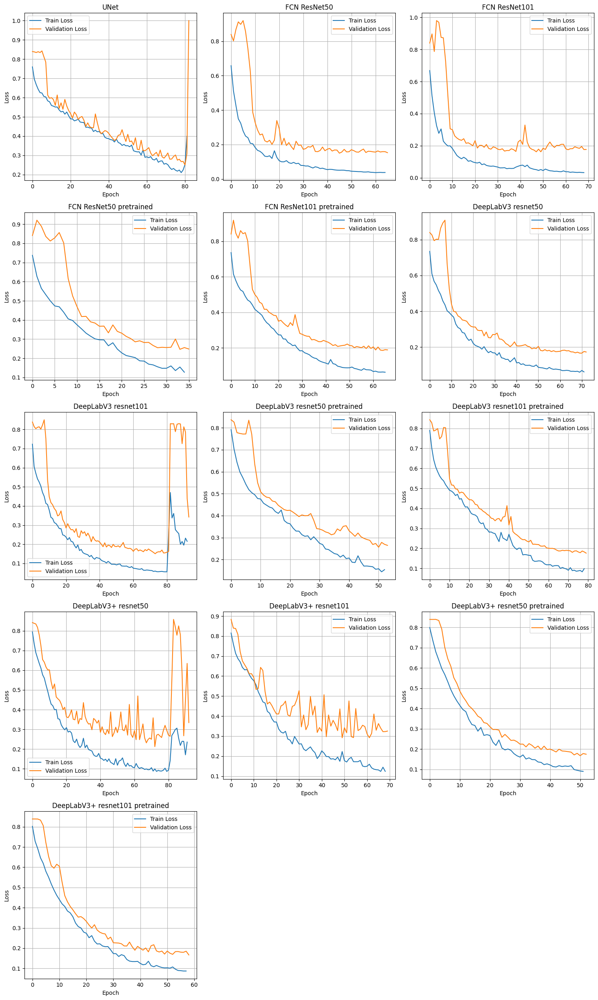

In [ ]:
import matplotlib.pyplot as plt



# Suponiendo que tienes estas listas:
train_losses = [
    train_unet_losses,
    train_fcn50_losses,
    train_fcn101_losses,
    train_fcn50_ft_losses,
    train_fcn101_ft_losses,
    train_deeplab50_losses,
    train_deeplab101_losses,
    train_deeplab50_ft_losses,
    train_deeplab101_ft_losses,
    train_deeplabv3plus50_losses,
    train_deeplabv3plus101_losses,
                train_deeplabv3plus50_ft_losses,
                train_deeplabv3plus101_ft_losses]  # Lista de listas: cada elemento es una lista de pérdidas de entrenamiento por época

val_losses = [
    val_unet_losses,
    val_fcn50_losses,
    val_fcn101_losses,
    val_fcn50_ft_losses,
    val_fcn101_ft_losses,
    val_deeplab50_losses,
    val_deeplab101_losses,
    val_deeplab50_ft_losses,
    val_deeplab101_ft_losses,
    val_deeplabv3plus50_losses,
              val_deeplabv3plus101_losses,
              val_deeplabv3plus50_ft_losses,
              val_deeplabv3plus101_ft_losses]    # Lista de listas: cada elemento es una lista de pérdidas de validación por época
model_names = [
    "UNet",
    "FCN ResNet50","FCN ResNet101",
    "FCN ResNet50 pretrained","FCN ResNet101 pretrained",
    "DeepLabV3 resnet50", "DeepLabV3 resnet101",
    "DeepLabV3 resnet50 pretrained", "DeepLabV3 resnet101 pretrained",
    "DeepLabV3+ resnet50", "DeepLabV3+ resnet101",
    "DeepLabV3+ resnet50 pretrained", "DeepLabV3+ resnet101 pretrained"]  # Lista con los nombres de cada modelo

# Crear mosaico con subplots
num_models = len(model_names)
cols = 3  # Número de columnas del mosaico
rows = (num_models + cols - 1) // cols  # Cálculo de filas necesarias

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Convertir axs en una lista plana para indexar fácilmente
axs = axs.flatten()

# Graficar cada curva en su subplot
for i in range(num_models):
    axs[i].plot(train_losses[i], label="Train Loss")
    axs[i].plot(val_losses[i], label="Validation Loss")
    axs[i].set_title(model_names[i])
    axs[i].set_xlabel("Epoch")
    axs[i].set_ylabel("Loss")
    axs[i].legend()
    axs[i].grid(True)

# Si hay más subplots que modelos, esconder los subplots sobrantes
for j in range(num_models, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.savefig("loss_curves_mosaic.png", dpi=300)
plt.show()
